In [7]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc




In [8]:
import celloracle as co

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
Matplotlib is building the font cache; this may take a moment.


In [9]:
import os
print("PYTHONPATH:", os.environ.get('PYTHONPATH'))
print("PATH:", os.environ.get('PATH'))

PYTHONPATH: None
PATH: /Users/derekebowman/miniconda3/envs/CellOracle/bin:/opt/anaconda3/condabin:/opt/homebrew/bin/python3:/Users/derekebowman/.local/bin:/opt/homebrew/bin:/opt/homebrew/sbin:/Library/Frameworks/Python.framework/Versions/3.12/bin:/Library/Frameworks/Python.framework/Versions/3.11/bin:/Library/Frameworks/Python.framework/Versions/3.10/bin:/usr/local/bin:/System/Cryptexes/App/usr/bin:/usr/bin:/bin:/usr/sbin:/sbin:/var/run/com.apple.security.cryptexd/codex.system/bootstrap/usr/local/bin:/var/run/com.apple.security.cryptexd/codex.system/bootstrap/usr/bin:/var/run/com.apple.security.cryptexd/codex.system/bootstrap/usr/appleinternal/bin:/opt/X11/bin:/Library/Apple/usr/bin:/Users/derekebowman/Downloads/chromedriver-mac-arm64


In [10]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["figure.figsize"] = [6, 4.5]

In [11]:
cd '/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/CellOracle/Male/24W_Control_vs_24W_HF'

/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/CellOracle/Male/24W_Control_vs_24W_HF


/Users/derekebowman/miniconda3/envs/CellOracle/lib/python3.10/site-packages/ipython-8.26.0-py3.10.egg/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [15]:
adata_path = '/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/Full_taPVAT_combined_annotated_with_immune_fibro_ecs_all_genes_unnormalized.h5ad'
adata = sc.read(adata_path)


In [16]:
adata

AnnData object with n_obs × n_vars = 71813 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'raw_counts', 'soupX_counts'

In [17]:
adata = adata[adata.obs['celltype'] == 'Adipocytes_Brown']
adata = adata[adata.obs['sex'] == 'M']
adata = adata[adata.obs['time'] == '24W']


In [18]:
adata

View of AnnData object with n_obs × n_vars = 13862 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'raw_counts', 'soupX_counts'

In [19]:
def TimeDiet(row):
    if row['time'] == '8W' and row['diet'] == 'Control':
        return '8W_Control'
    elif row['time'] == '8W' and row['diet'] == 'HF':
        return '8W_HF'
    elif row['time'] == '24W' and row['diet'] == 'HF':
        return '24W_HF'
    elif row['time'] == '24W' and row['diet'] == 'Control':
        return '24W_Control'
    else:
        return 'There was an error'


In [20]:
# Apply the function to each row in adata.obs
adata.obs['time_diet'] = adata.obs.apply(TimeDiet, axis=1)

In [21]:
adata.obs[adata.obs.time_diet == 'There was an error']

,sample_id,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,...,MAP_9W,systolic_bp_9W,MAP_16W,systolic_bp_16W,MAP_24W,systolic_bp_24W,doublet,celltype,celltype_broad,time_diet


# CellOracle Preprocessing 
https://morris-lab.github.io/CellOracle.documentation/notebooks/03_scRNA-seq_data_preprocessing/scanpy_preprocessing_with_Paul_etal_2015_data.html#Notebook-file

In [22]:
# Only consider genes with more than 1 count
sc.pp.filter_genes(adata, min_counts=1)

In [23]:
# Normalize gene expression matrix with total UMI count per cell
sc.pp.normalize_per_cell(adata, key_n_counts='n_counts_all')

In [24]:
# Select top 2000 highly-variable genes
filter_result = sc.pp.filter_genes_dispersion(adata.X,
                                              flavor='cell_ranger',
                                              n_top_genes=2000,
                                              log=False)

# Subset the genes
adata = adata[:, filter_result.gene_subset]

# Renormalize after filtering
sc.pp.normalize_per_cell(adata)



In [25]:
# keep raw cont data before log transformation
adata.raw = adata
adata.layers["raw_count"] = adata.raw.X.copy()
# Log transformation and scaling
sc.pp.log1p(adata)
sc.pp.scale(adata)

In [26]:
# PCA
sc.tl.pca(adata, svd_solver='arpack')

# Diffusion map
sc.pp.neighbors(adata, n_neighbors=4, n_pcs=20)

sc.tl.diffmap(adata)
# Calculate neihbors again based on diffusionmap
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_diffmap')

... storing 'time_diet' as categorical


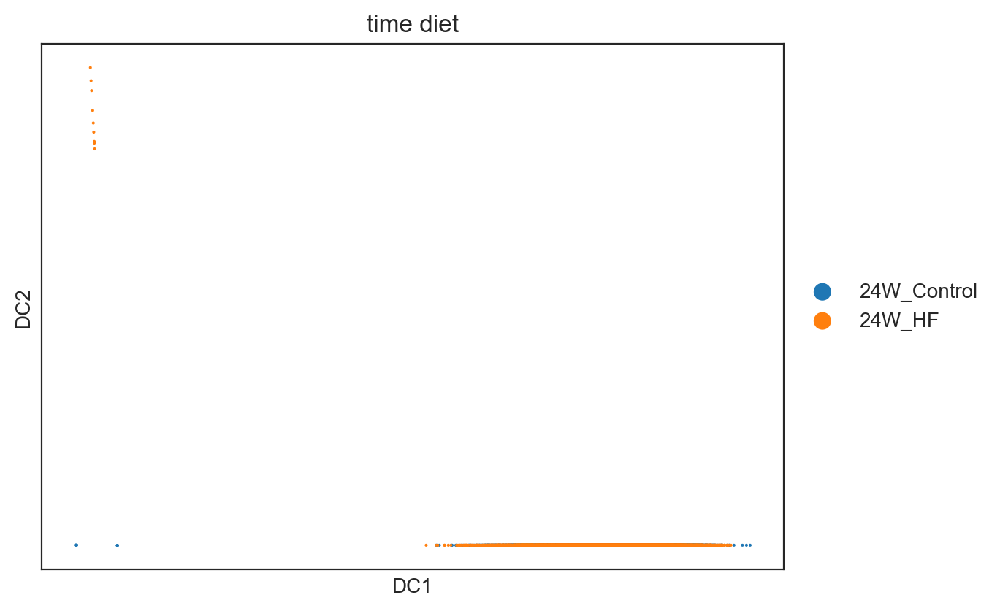

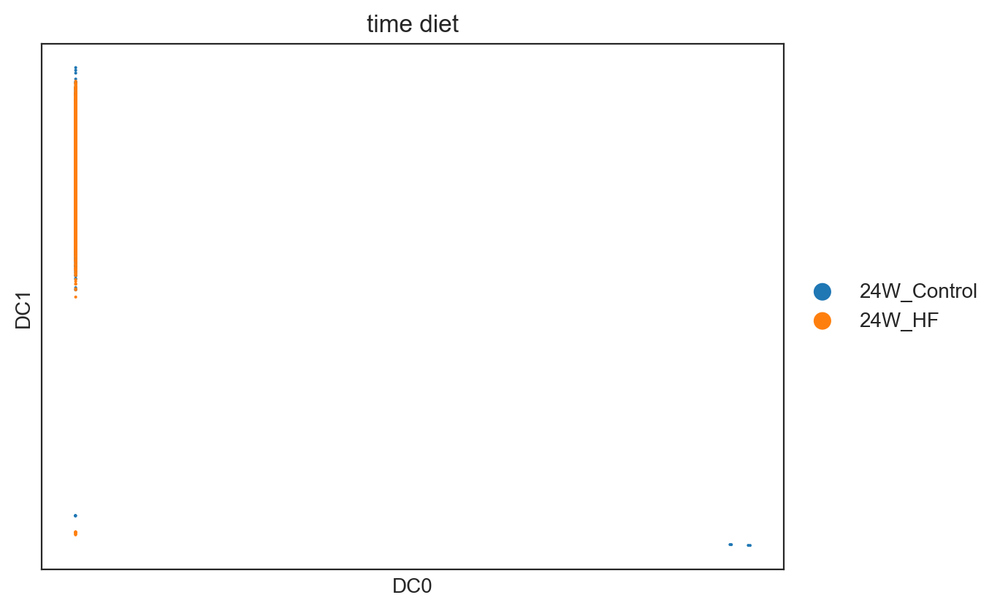

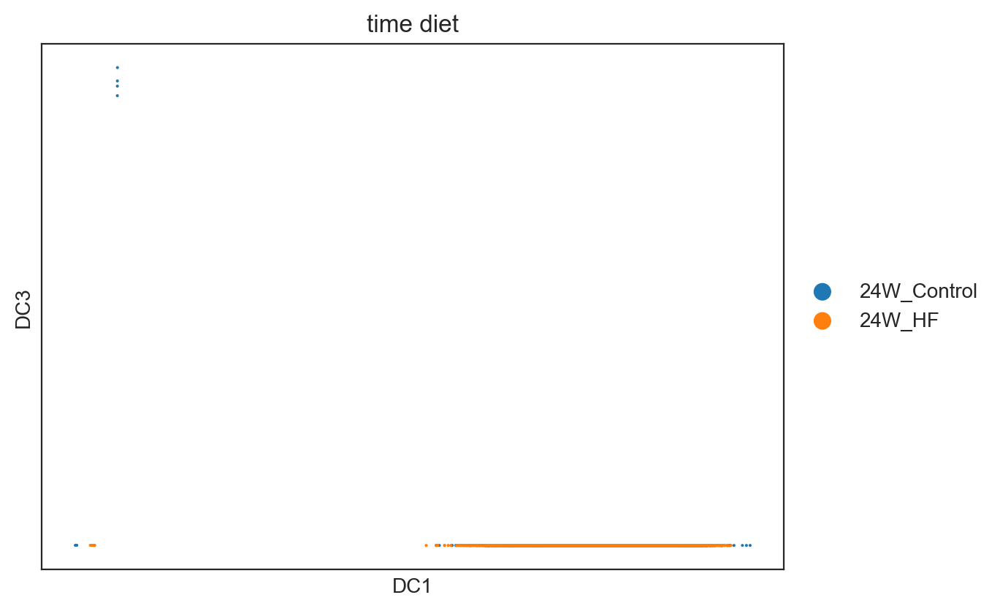

In [27]:
# Taking a look at the diffusion map plots
sc.pl.scatter(adata, 
              basis="diffmap", 
              color=["time_diet"],
              components= [1,2])

sc.pl.scatter(adata, 
              basis="diffmap", 
              color=["time_diet"],
              components= [0,1])

sc.pl.scatter(adata, 
              basis="diffmap", 
              color=["time_diet"],
              components= [1,3])


In [28]:
# Using leiden instead of louvain
sc.tl.leiden(adata, resolution=0.8)

In [29]:
# PAGA graph construction
sc.tl.paga(adata, groups='leiden')

In [30]:
plt.rcParams["figure.figsize"] = [6, 4.5]

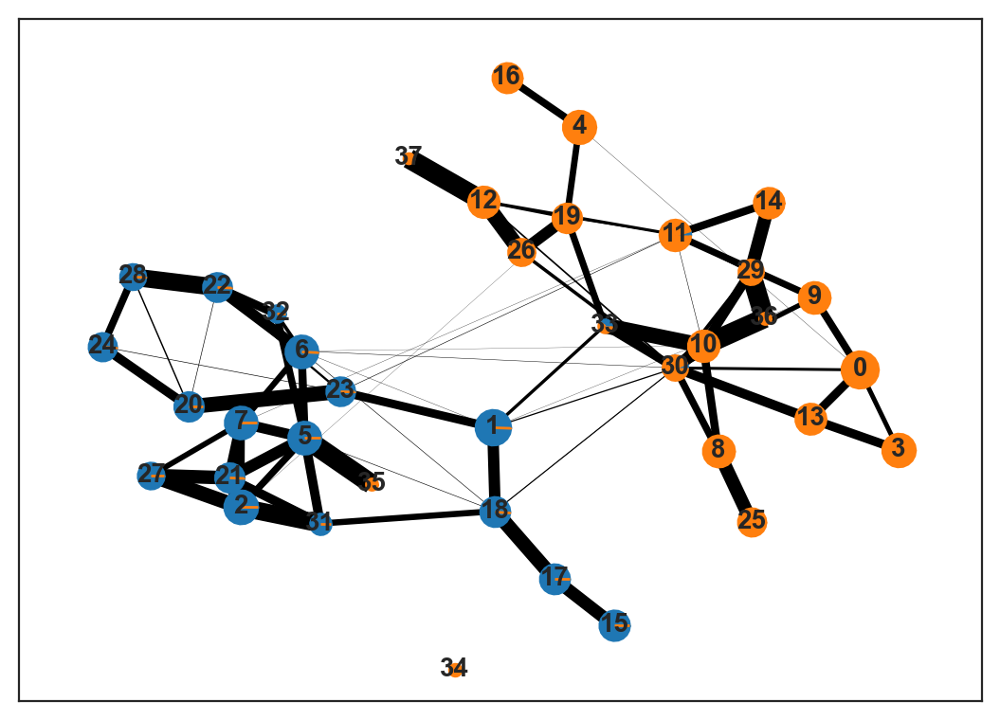

In [31]:
sc.pl.paga(adata, color = 'time_diet')

In [32]:
sc.tl.draw_graph(adata, init_pos='paga', random_state=123)



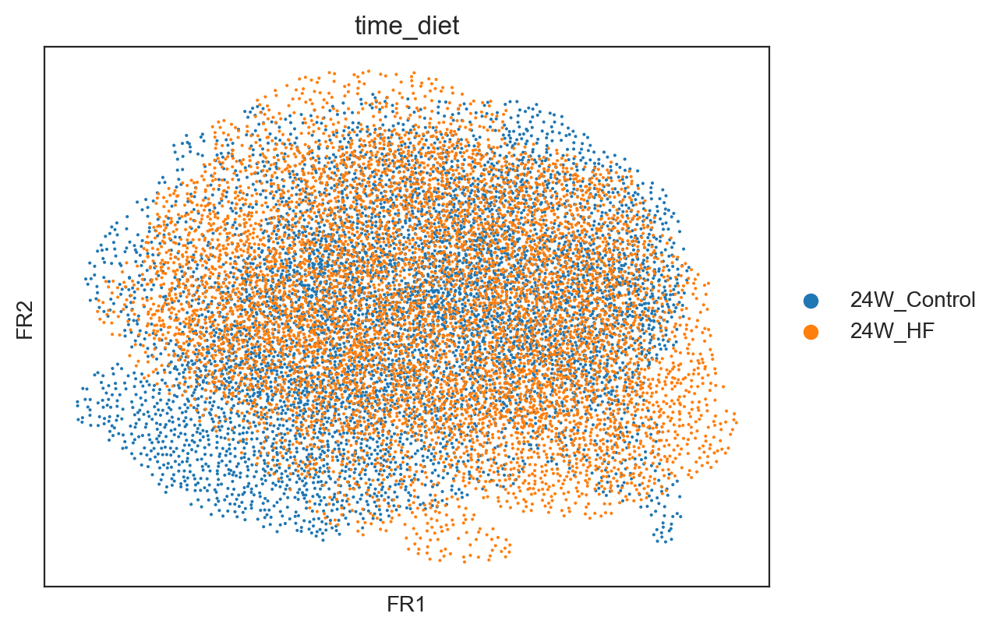

In [33]:
sc.pl.draw_graph(adata, color='time_diet', legend_loc='right margin')



In [34]:
# Save data if desired
# adata.write_h5ad("Your_File_Name_Here.h5ad")

# Preprocessing complete, now Pseudotime Calculation

https://cellrank.readthedocs.io/en/latest/notebooks/tutorials/kernels/300_pseudotime.html

https://morris-lab.github.io/CellOracle.documentation/notebooks/05_simulation/Pseudotime_calculation_with_Paul_etal_2015_data.html



In [35]:
import copy
import glob
import time
import os
import shutil
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from tqdm.auto import tqdm

In [36]:
import celloracle as co
from celloracle.applications import Pseudotime_calculator
co.__version__

'0.18.0'

In [37]:
# Since I could not install fa2, 
# I am creating a new column called X_draw_graph_fa
# that is equivalent to X_draw_graph_fr
adata.obsm['X_draw_graph_fa'] = adata.obsm['X_draw_graph_fr'].copy()

In [38]:
adata.obsm

AxisArrays with keys: X_pca, X_diffmap, X_draw_graph_fr, X_draw_graph_fa

In [39]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [5,5]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300

%matplotlib inline

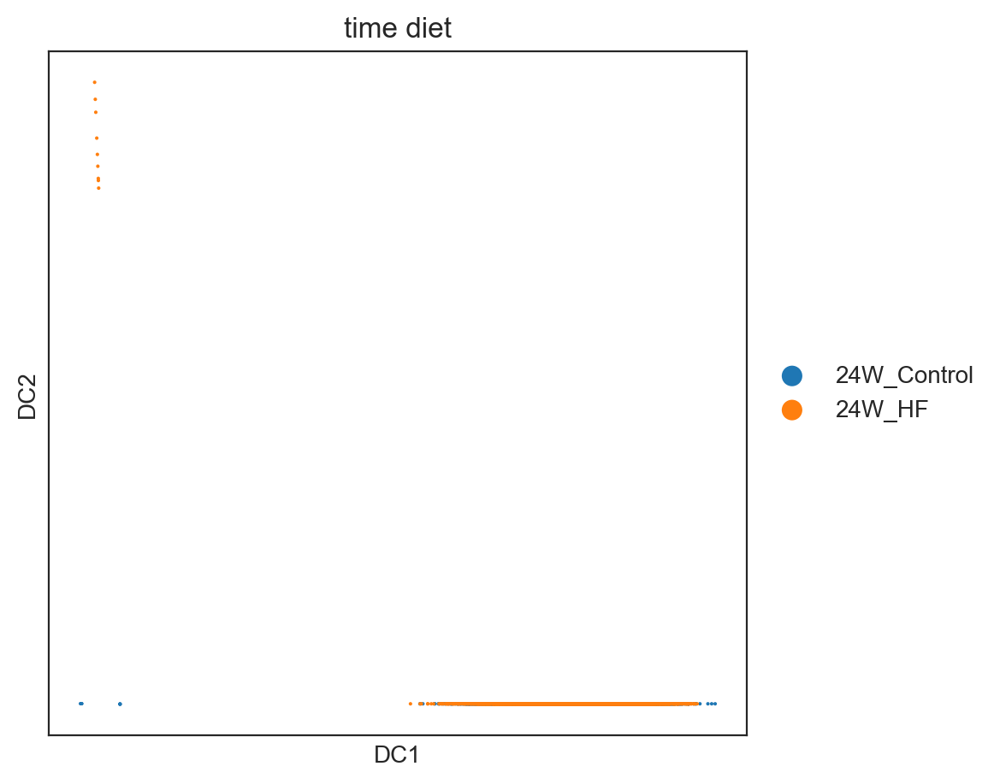

In [40]:
# Plot diffusion map by diet
sc.pl.scatter(adata, 
              basis="diffmap", 
              color="time_diet")

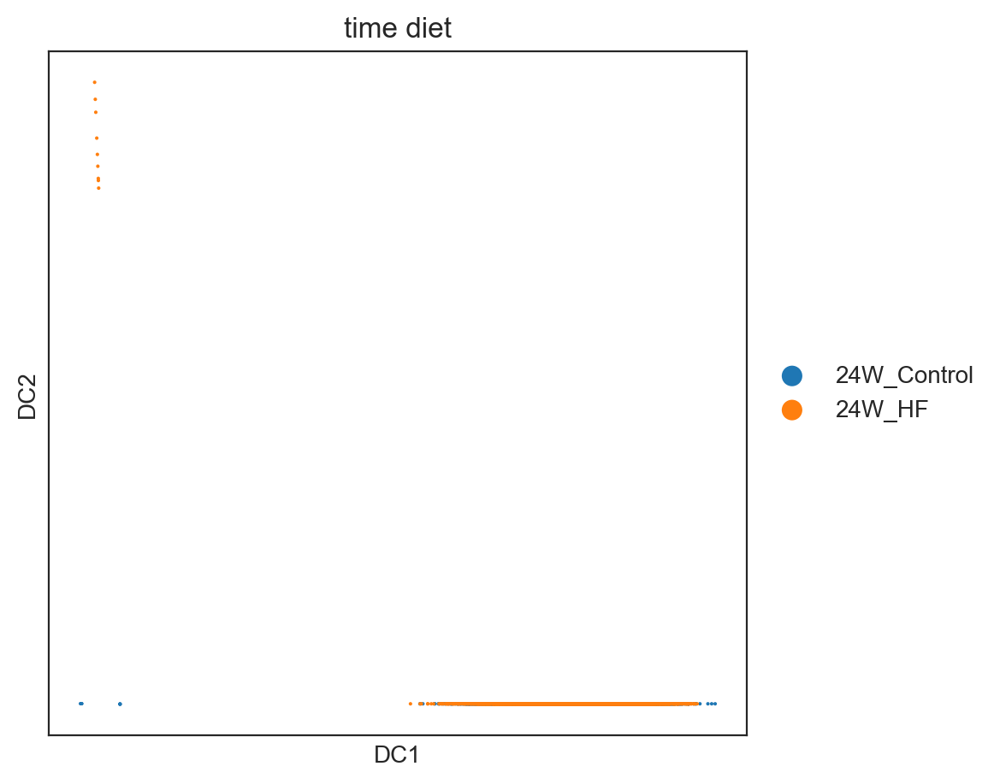

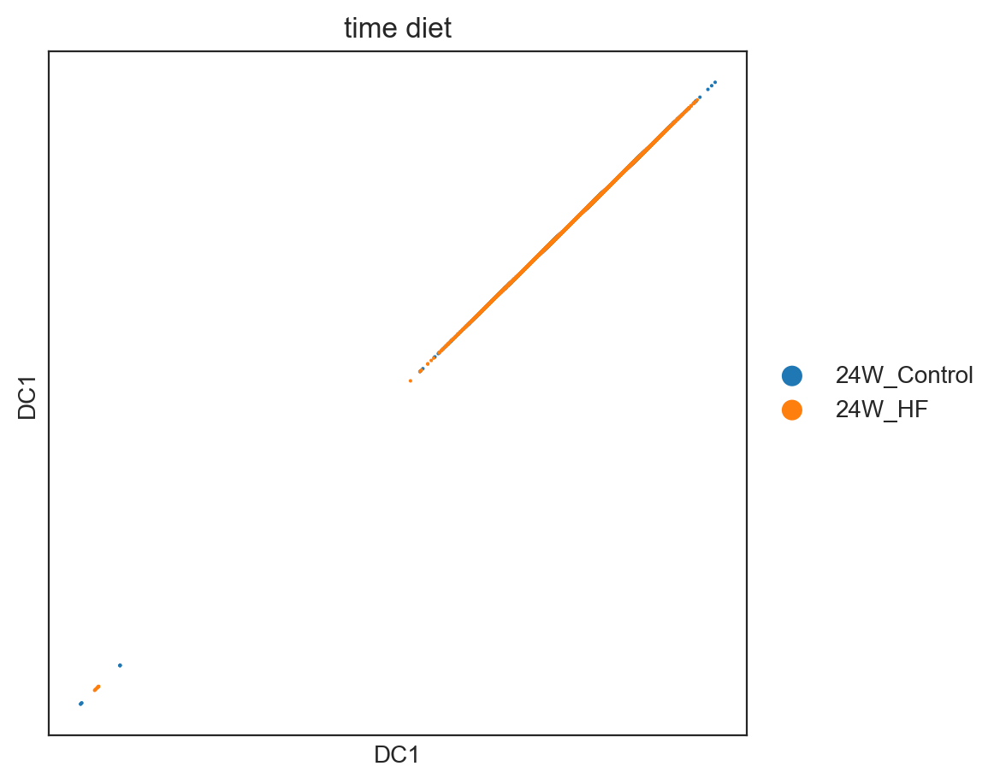

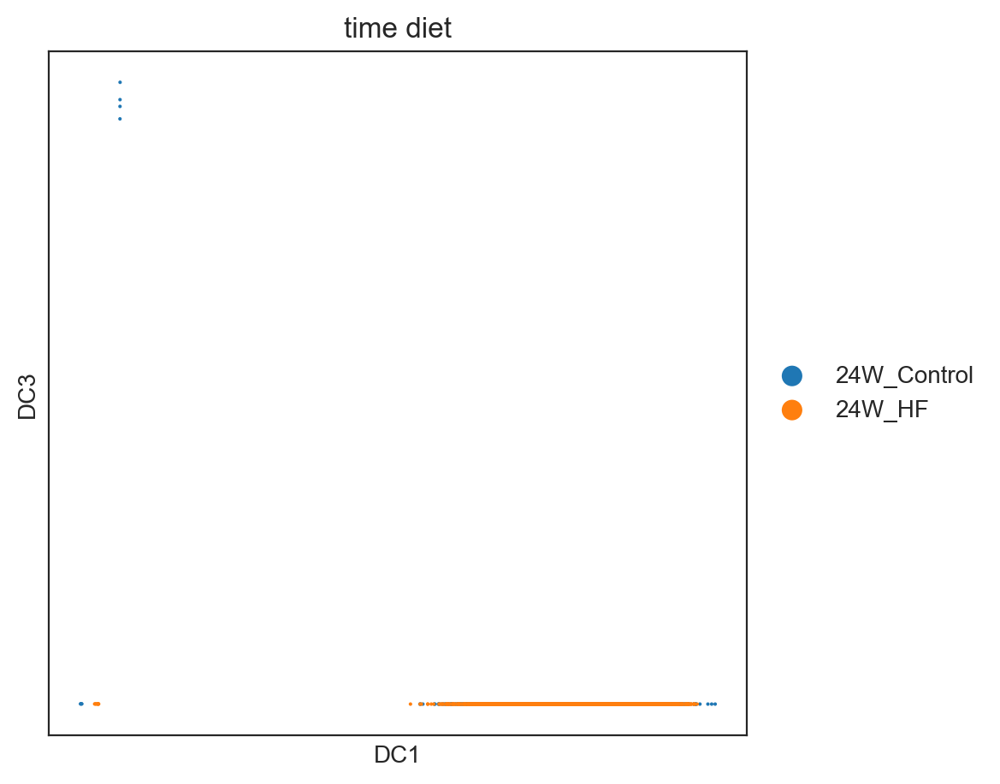

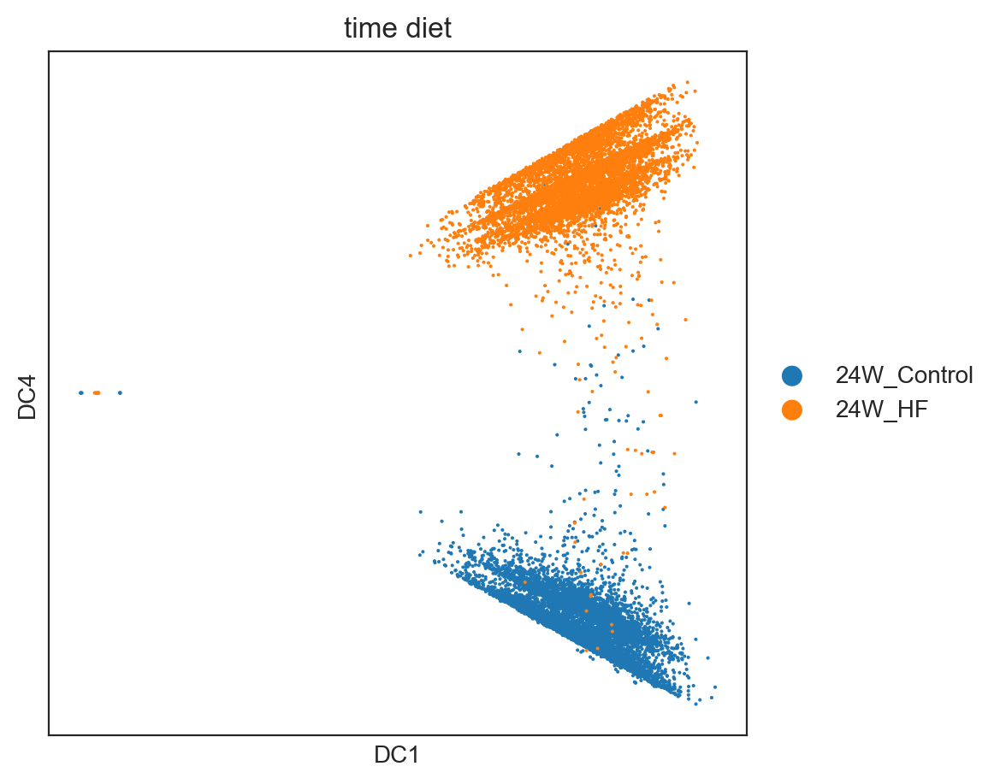

In [41]:
# Setting root cell to the cell with min DC1 value (8W_Control).
root_ixs =adata.obsm["X_diffmap"][:, 4].argmax()

sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"])

sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 1],
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 3],
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 4],
)
adata.uns["iroot"] = root_ixs

In [42]:
sc.tl.dpt(adata) 

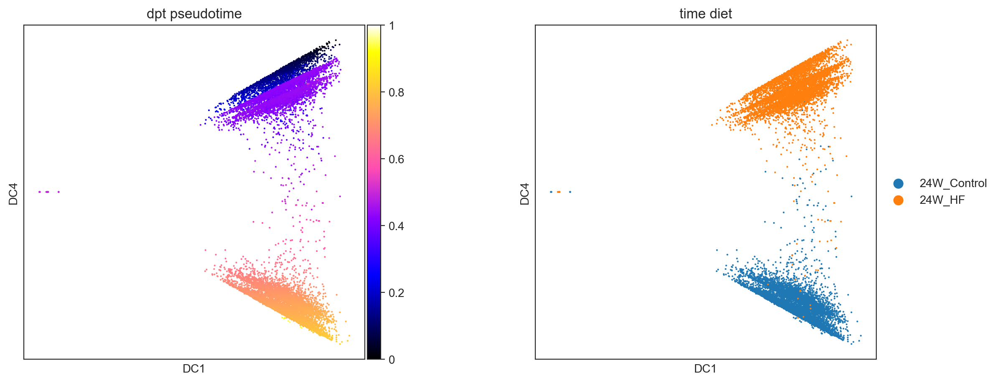

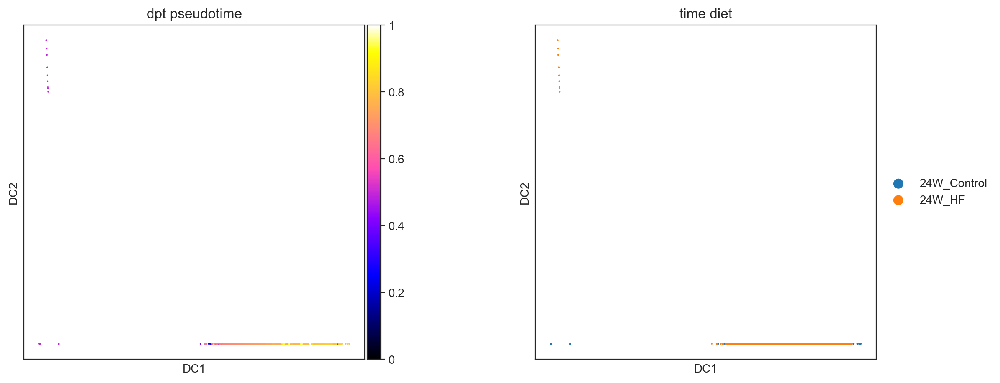

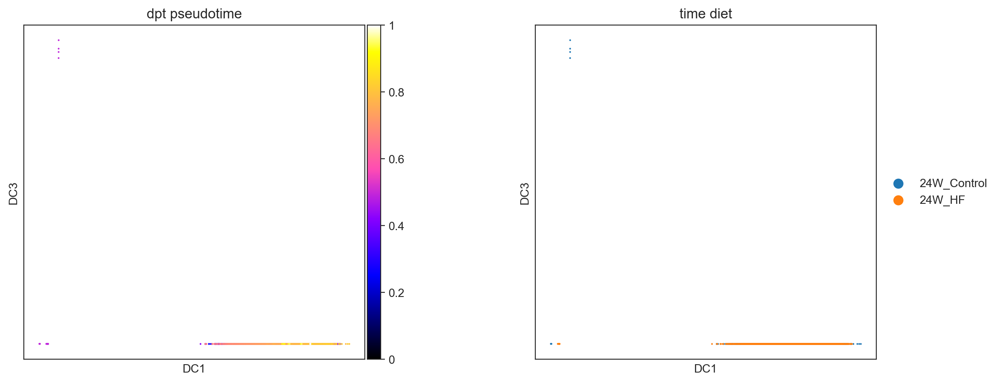

In [43]:
# Plot psedotime on diffusion map
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["dpt_pseudotime", "time_diet"],
    color_map="gnuplot2",
     components=[1, 4]
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["dpt_pseudotime", "time_diet"],
    color_map="gnuplot2",
     components=[1, 2]
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["dpt_pseudotime", "time_diet"],
    color_map="gnuplot2",
     components=[1, 3]
)

In [44]:
sc.tl.umap(adata)

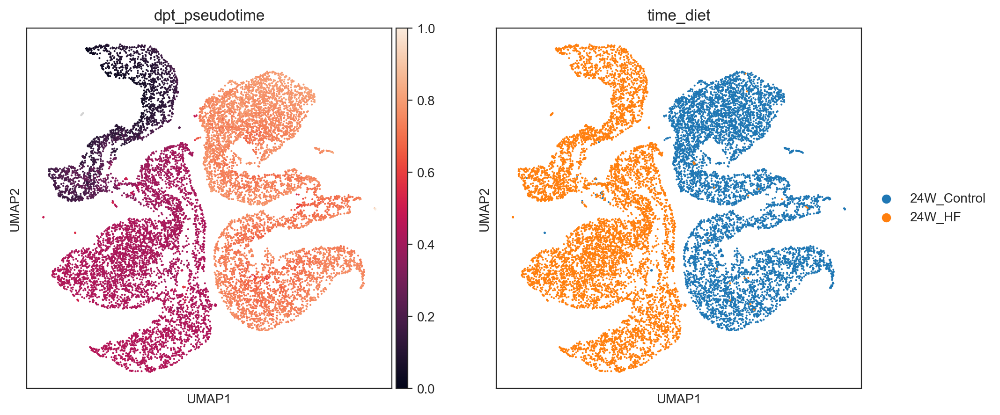

In [45]:
sc.pl.umap(adata, color=['dpt_pseudotime', 'time_diet'],ncols=2)

# Starting GRN Model Construction and Network Analysis 
https://morris-lab.github.io/CellOracle.documentation/notebooks/04_Network_analysis/Network_analysis_with_Paul_etal_2015_data.html

In [46]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns


import celloracle as co
co.__version__



'0.18.0'

In [47]:
# visualization settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300

In [48]:
save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)



In [49]:
# Load the built int rat promoter base GRN.
base_GRN = co.data.load_rat_promoter_base_GRN()

# Check data
base_GRN.head()



Loading prebuilt promoter base-GRN. Version: rn6_gimmemotifsv5_fpr2


,peak_id,gene_short_name,9430076c15rik,Ac002126.6,Ac012531.1,Ac226150.2,Afp,Ahr,Ahrr,Aire,...,Znf784,Znf8,Znf816,Znf85,Zscan10,Zscan16,Zscan22,Zscan26,Zscan31,Zscan4
0,chr10_101287528_101288628,Sox9,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_101696238_101697338,Mir297,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
2,chr10_102083380_102084480,Slc39a11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,chr10_102135283_102136383,Sstr2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_102166771_102167871,Cog1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [50]:
# Instantiate Oracle object
oracle = co.Oracle()

In [51]:
# In this notebook, we use the unscaled mRNA count for the input of Oracle object.
adata.X = adata.layers["raw_count"].copy()

# Instantiate Oracle object.
oracle.import_anndata_as_raw_count(adata=adata,
                                   cluster_column_name="time_diet",
                                   embedding_name="X_diffmap")

In [52]:
oracle.import_TF_data(TF_info_matrix=base_GRN)

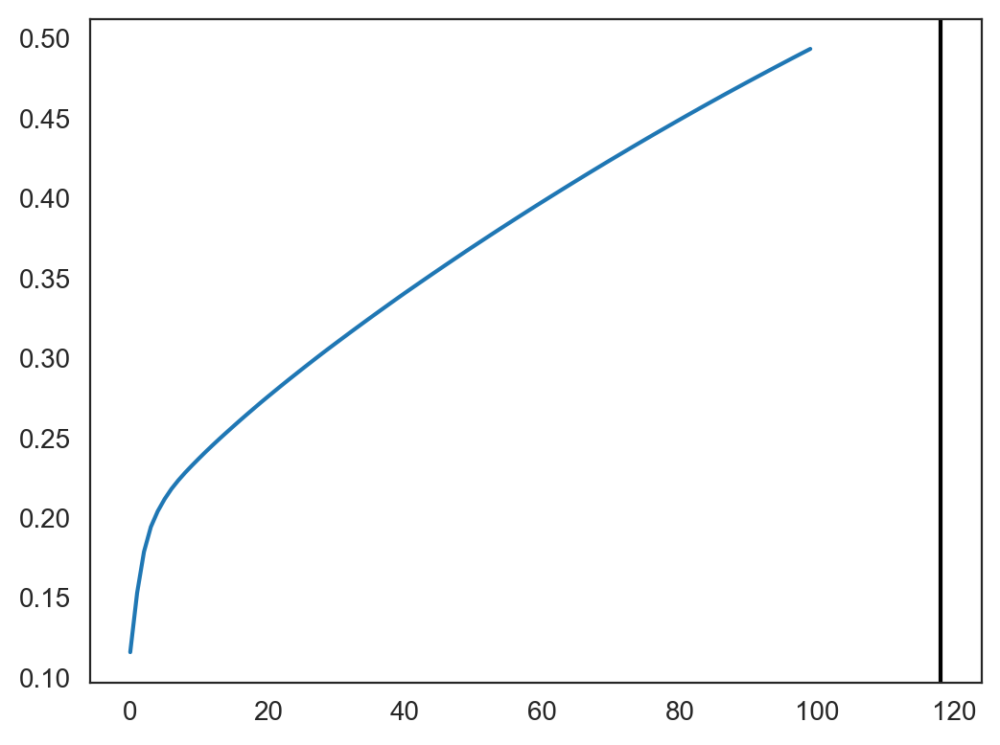

118


In [53]:
# Perform PCA
oracle.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)



In [54]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :13862


In [55]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")


Auto-selected k is :346


In [56]:
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=-1)

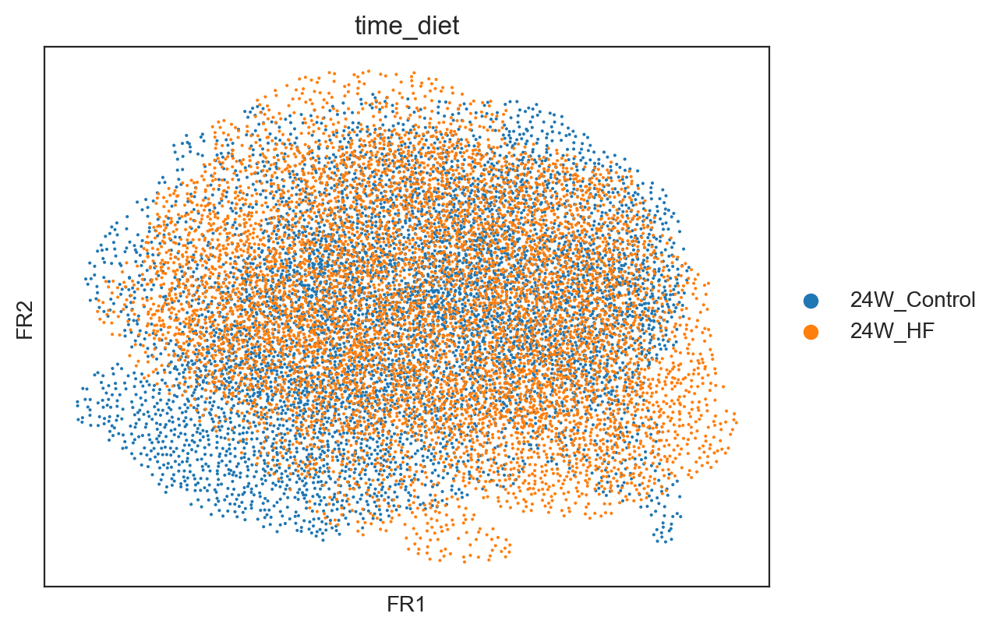

In [57]:
# Check clustering data
sc.pl.draw_graph(oracle.adata, color="time_diet")

In [58]:
%%time
# This step may take some time.(~30 minutes)
links = oracle.get_links(cluster_name_for_GRN_unit="time_diet", alpha=10,
                         verbose_level=10, n_jobs=-1)



  0%|          | 0/2 [00:00<?, ?it/s]

Inferring GRN for 24W_Control...


  0%|          | 0/1391 [00:00<?, ?it/s]

Inferring GRN for 24W_HF...


  0%|          | 0/1391 [00:00<?, ?it/s]

CPU times: user 55.5 s, sys: 5.62 s, total: 1min 1s
Wall time: 1min 49s


In [59]:
tf_list= list(links.links_dict["24W_HF"]['source'].unique())

tf_list.sort()

print(tf_list)

['Ahr', 'Arid5b', 'Ascl1', 'Atf3', 'Bach2', 'Bcl6b', 'Cebpb', 'Creb5', 'Dmrt2', 'Dux4', 'Ebf1', 'Egr1', 'En2', 'Epas1', 'Ets2', 'Fli1', 'Fos', 'Fosb', 'Gfi1b', 'Hes2', 'Heyl', 'Hivep1', 'Hivep2', 'Hlf', 'Hoxa9', 'Hoxb5', 'Hoxb6', 'Hoxb7', 'Hoxd10', 'Id1', 'Id3', 'Ikzf1', 'Irf4', 'Jdp2', 'Jun', 'Jund', 'Klf2', 'Klf4', 'Lbx2', 'Lef1', 'Lmx1b', 'Maf', 'Max', 'Mecom', 'Mef2c', 'Meox1', 'Meox2', 'Mitf', 'Myc', 'Nfe2', 'Nfia', 'Npas2', 'Npas3', 'Nr4a1', 'Nr4a2', 'Nr4a3', 'Olig2', 'Osr1', 'Pitx1', 'Plagl1', 'Ppara', 'Ppard', 'Pparg', 'Ppargc1a', 'Prdm16', 'Rara', 'Rfx4', 'Rfx6', 'Rfx8', 'Rora', 'Runx3', 'Rxrg', 'Smad3', 'Smarca1', 'Snai2', 'Sox17', 'Tbx20', 'Tcf15', 'Tcf7l1', 'Tead3', 'Thra', 'Wt1', 'Ybx2', 'Zbtb16']


In [60]:
len(tf_list)

84

In [61]:
raise ValueError('stop here')

ValueError: stop here

In [ ]:
links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)

In [ ]:
links.links_dict["24W_HF"]['source'].unique()

array(['Max', 'Npas2', 'Jun', 'Myc', 'Lmx1b', 'Cebpb', 'Klf4', 'Tcf15',
       'Nfe2', 'Wt1', 'Id3', 'Fos', 'Heyl', 'Egr1', 'Jund', 'Hes2', 'Id1',
       'Jdp2', 'Klf2', 'Rara', 'Fosb', 'Mef2c', 'Ppargc1a', 'Atf3',
       'Zbtb16', 'Ets2', 'Plagl1', 'Thra', 'Fli1', 'Maf', 'Nr4a3', 'Ebf1',
       'Pitx1', 'Nr4a1', 'Nr4a2', 'Irf4', 'Dux4', 'Epas1', 'Osr1',
       'Npas3', 'Hivep2', 'Hivep1', 'Rfx8', 'Hoxa9', 'Mitf', 'Rfx4',
       'Rfx6', 'Olig2', 'Bach2', 'Tead3', 'Pparg', 'Ppara', 'Hoxd10',
       'Ppard', 'Ahr', 'Rora', 'Prdm16', 'Tbx20', 'Mecom', 'Rxrg', 'En2',
       'Nfia', 'Lbx2', 'Dmrt2', 'Runx3', 'Smarca1', 'Gfi1b', 'Bcl6b',
       'Ascl1', 'Sox17', 'Smad3', 'Snai2', 'Arid5b', 'Creb5', 'Hoxb6',
       'Hoxb7', 'Tcf7l1', 'Lef1', 'Ikzf1', 'Ybx2', 'Hoxb5', 'Meox2',
       'Meox1', 'Hlf'], dtype=object)

In [ ]:
HF_24W_GRN = links.filtered_links['24W_HF']
HF_24W_GRN['source'].nunique()

69

In [ ]:
list_of_tfs = list(HF_24W_GRN['source'].unique())
list_of_tfs.sort()
list_of_tfs



['Ahr',
 'Ascl1',
 'Atf3',
 'Bach2',
 'Bcl6b',
 'Cebpb',
 'Creb5',
 'Ebf1',
 'Egr1',
 'Epas1',
 'Ets2',
 'Fli1',
 'Fos',
 'Fosb',
 'Gfi1b',
 'Heyl',
 'Hivep1',
 'Hivep2',
 'Hlf',
 'Hoxa9',
 'Id1',
 'Id3',
 'Ikzf1',
 'Irf4',
 'Jdp2',
 'Jun',
 'Jund',
 'Klf2',
 'Klf4',
 'Lef1',
 'Lmx1b',
 'Maf',
 'Max',
 'Mecom',
 'Mef2c',
 'Meox2',
 'Mitf',
 'Myc',
 'Nfe2',
 'Nfia',
 'Npas2',
 'Npas3',
 'Nr4a1',
 'Nr4a2',
 'Nr4a3',
 'Olig2',
 'Osr1',
 'Pitx1',
 'Plagl1',
 'Ppara',
 'Ppard',
 'Pparg',
 'Ppargc1a',
 'Prdm16',
 'Rara',
 'Rfx4',
 'Rfx8',
 'Rora',
 'Runx3',
 'Rxrg',
 'Smad3',
 'Smarca1',
 'Tcf15',
 'Tcf7l1',
 'Tead3',
 'Thra',
 'Wt1',
 'Ybx2',
 'Zbtb16']

In [ ]:
# quadrant_0_male = pd.read_csv('/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/Quadrant_Data/taPVAT_Adipocytes_Brown_Male_MetaDEGs_Quadrant_0.csv')
# quadrant_3_male = pd.read_csv('/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/Quadrant_Data/taPVAT_Adipocytes_Brown_Male_MetaDEGs_Quadrant_3.csv')



In [ ]:
tf_series = pd.Series(list_of_tfs)
combined_gene_ids = list(quadrant_0_male['gene_id']) + list(quadrant_3_male['gene_id'])
tf_series[tf_series.isin(combined_gene_ids)]

NameError: name 'list_of_tfs' is not defined

In [75]:
Control_24W_GRN = links.filtered_links['24W_Control']
Control_24W_GRN['source'].nunique()

73

In [76]:
plt.rcParams["figure.figsize"] = [9, 4.5]

24W_Control


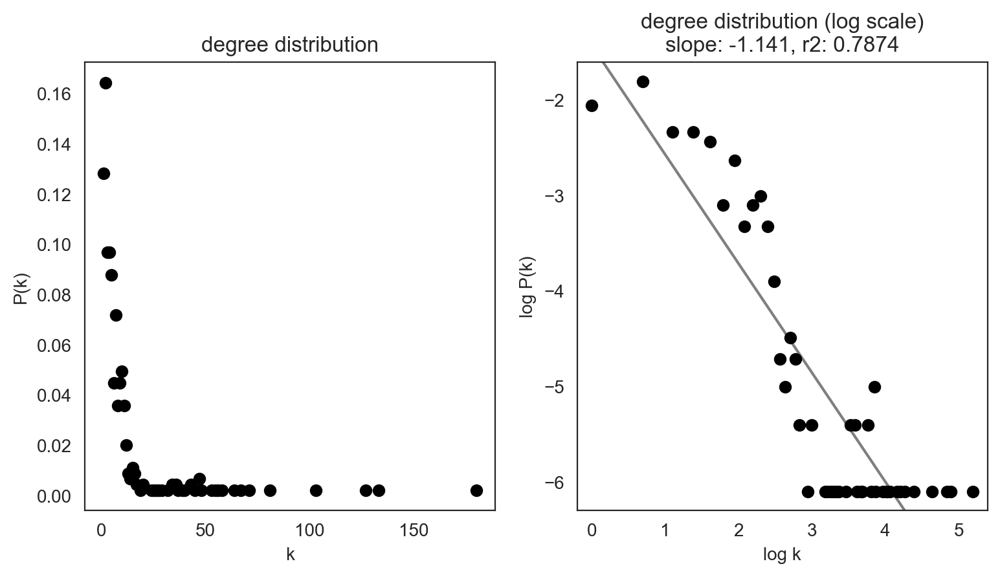

24W_HF


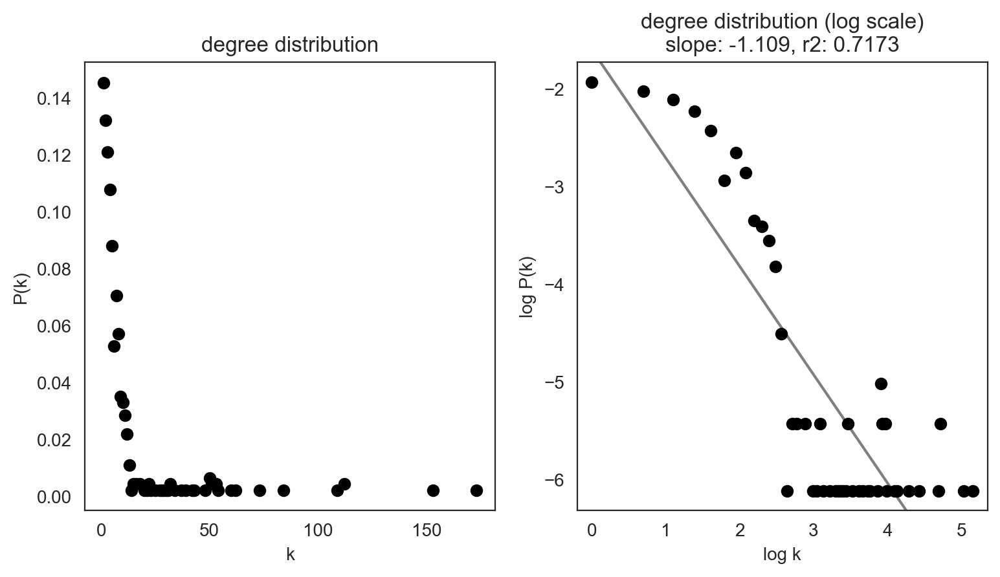

In [77]:
links.plot_degree_distributions(plot_model=True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )



In [78]:
plt.rcParams["figure.figsize"] = [6, 4.5]


# Calculate network scores.
links.get_network_score()



In [79]:
TFs = oracle.adata.var[oracle.adata.var['isin_TFdict_regulators']].index

In [80]:
TFs

Index(['Ahr', 'Arid5b', 'Ascl1', 'Atf3', 'Bach2', 'Bcl6b', 'Cebpb', 'Creb5',
       'Dmrt2', 'Dux4', 'Ebf1', 'Egr1', 'En2', 'Epas1', 'Ets2', 'Fli1', 'Fos',
       'Fosb', 'Gfi1b', 'Hes2', 'Heyl', 'Hivep1', 'Hivep2', 'Hlf', 'Hoxa9',
       'Hoxb5', 'Hoxb6', 'Hoxb7', 'Hoxd10', 'Id1', 'Id3', 'Ikzf1', 'Irf4',
       'Jdp2', 'Jun', 'Jund', 'Klf2', 'Klf4', 'Lbx2', 'Lef1', 'Lmx1b', 'Maf',
       'Max', 'Mecom', 'Mef2c', 'Meox1', 'Meox2', 'Mitf', 'Myc', 'Nfe2',
       'Nfia', 'Npas2', 'Npas3', 'Nr4a1', 'Nr4a2', 'Nr4a3', 'Olig2', 'Osr1',
       'Pitx1', 'Plagl1', 'Ppara', 'Ppard', 'Pparg', 'Ppargc1a', 'Prdm16',
       'Rara', 'Rfx4', 'Rfx6', 'Rfx8', 'Rora', 'Runx3', 'Rxrg', 'Smad3',
       'Smarca1', 'Snai2', 'Sox17', 'Tbx20', 'Tcf15', 'Tcf7l1', 'Tead3',
       'Thra', 'Wt1', 'Ybx2', 'Zbtb16'],
      dtype='object')

In [81]:
links_df = links.merged_score.copy()

In [82]:
links_df

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Myc,133,0.300226,0,0.000000,133,0.300226,0.0,0.522986,24W_Control
Scd,6,0.013544,6,0.013544,0,0.000000,0.0,0.257877,24W_Control
Rxrg,72,0.162528,2,0.004515,70,0.158014,1337.0,0.878544,24W_Control
Me1,16,0.036117,16,0.036117,0,0.000000,0.0,0.503697,24W_Control
Ppara,47,0.106095,15,0.033860,32,0.072235,649.0,0.657771,24W_Control
...,...,...,...,...,...,...,...,...,...
LOC502684,1,0.002208,1,0.002208,0,0.000000,0.0,0.005257,24W_HF
Rplp1,1,0.002208,1,0.002208,0,0.000000,0.0,0.004673,24W_HF
Rgl2,1,0.002208,1,0.002208,0,0.000000,0.0,0.008229,24W_HF
Wwtr1,1,0.002208,1,0.002208,0,0.000000,0.0,0.004579,24W_HF


In [83]:
# Creating a dataframe that includes only transcription factors
TF_links_df = links_df.loc[links_df.index.isin(TFs)]


In [84]:
TF_links_df 

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Myc,133,0.300226,0,0.000000,133,0.300226,0.0,0.522986,24W_Control
Rxrg,72,0.162528,2,0.004515,70,0.158014,1337.0,0.878544,24W_Control
Ppara,47,0.106095,15,0.033860,32,0.072235,649.0,0.657771,24W_Control
Ebf1,103,0.232506,9,0.020316,94,0.212190,1541.0,0.583690,24W_Control
Irf4,58,0.130926,11,0.024831,47,0.106095,688.0,0.512774,24W_Control
...,...,...,...,...,...,...,...,...,...
Ascl1,1,0.002208,0,0.000000,1,0.002208,0.0,0.001569,24W_HF
Ikzf1,1,0.002208,0,0.000000,1,0.002208,0.0,0.003110,24W_HF
Smarca1,1,0.002208,0,0.000000,1,0.002208,0.0,0.001909,24W_HF
Pitx1,3,0.006623,0,0.000000,3,0.006623,0.0,0.006106,24W_HF


In [61]:
# Creating separate DataFrames for each cluster
df_24W_HF = TF_links_df [TF_links_df['cluster'] == '24W_HF']
df_24W_Control = TF_links_df [TF_links_df ['cluster'] == '24W_Control']

In [62]:
df_24W_Control

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Myc,130,0.292135,0,0.000000,130,0.292135,0.0,0.569432,24W_Control
Rxrg,75,0.168539,2,0.004494,73,0.164045,1360.0,0.935908,24W_Control
Ppara,45,0.101124,14,0.031461,31,0.069663,515.0,0.688125,24W_Control
Ebf1,103,0.231461,9,0.020225,94,0.211236,1415.0,0.598536,24W_Control
Irf4,61,0.137079,12,0.026966,49,0.110112,1118.0,0.502273,24W_Control
...,...,...,...,...,...,...,...,...,...
Ets2,5,0.011236,0,0.000000,5,0.011236,0.0,0.011829,24W_Control
Hoxb5,1,0.002247,0,0.000000,1,0.002247,0.0,0.002764,24W_Control
Ikzf1,1,0.002247,0,0.000000,1,0.002247,0.0,0.003060,24W_Control
Ahr,2,0.004494,0,0.000000,2,0.004494,0.0,0.007246,24W_Control


In [63]:
df_24W_HF

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Hivep2,28,0.061674,15,0.033040,13,0.028634,142.0,0.542083,24W_HF
Irf4,80,0.176211,7,0.015419,73,0.160793,2095.0,0.833976,24W_HF
Atf3,169,0.372247,0,0.000000,169,0.372247,0.0,1.000000,24W_HF
Nr4a2,47,0.103524,1,0.002203,46,0.101322,373.0,0.302884,24W_HF
Ebf1,114,0.251101,8,0.017621,106,0.233480,1263.0,0.939711,24W_HF
...,...,...,...,...,...,...,...,...,...
Ahr,3,0.006608,0,0.000000,3,0.006608,0.0,0.004387,24W_HF
Ikzf1,1,0.002203,0,0.000000,1,0.002203,0.0,0.003668,24W_HF
Ascl1,1,0.002203,0,0.000000,1,0.002203,0.0,0.001632,24W_HF
Gfi1b,1,0.002203,0,0.000000,1,0.002203,0.0,0.000000,24W_HF


In [64]:
# Create separate dataframes to append the ratio data to.

ratios_24W_HF_vs_24W_Control = pd.DataFrame(index=df_24W_HF.index)


In [65]:
# Calculate ratios for each centrality measure
for measure in ['eigenvector_centrality', 'betweenness_centrality','degree_centrality_all', 'degree_centrality_out']:
    # Replace zero values with np.nan to avoid division by zero
    
    safe_24W_Control = df_24W_Control[measure].replace(0, np.nan)
    
    # Calculate the ratios
    ratios_24W_HF_vs_24W_Control[measure] = df_24W_HF[measure] / safe_24W_Control
    
    # ratios_24W_HF_vs_8W_HF[measure] = df_24W_HF[measure] / safe_8W_HF
    # ratios_24W_HF_vs_8W_Control[measure] = df_24W_HF[measure] / safe_8W_Control

# Drop NaN values that might have resulted from division by zero
    ratios_24W_HF_vs_24W_Control.dropna(inplace=True)


top_20_tfs_24W_HF_vs_24W_Control = ratios_24W_HF_vs_24W_Control.sort_values('degree_centrality_out',ascending=False).head(20)

print("24W_HF vs. 24W_Control:", top_20_tfs_24W_HF_vs_24W_Control)






top_20_tfs_24W_HF_vs_24W_Control  = top_20_tfs_24W_HF_vs_24W_Control.rename(columns={'eigenvector_centrality': 'eigenvector_centrality_ratio', 
                                                                        'betweenness_centrality': 'betweenness_centrality_ratio',
                                                                        'degree_centrality_all': 'degree_centrality_all_ratio',
                                                                        'degree_centrality_out': 'degree_centrality_out_ratio'})

print("24W_HF vs. 24W_Control:", top_20_tfs_24W_HF_vs_24W_Control)



24W_HF vs. 24W_Control:           eigenvector_centrality  betweenness_centrality  \
Cebpb                   2.210774                4.209889   
Nr4a2                   2.583036                1.065714   
Nr4a3                   1.725339                2.063981   
Mecom                   0.958050                2.155440   
Irf4                    1.660404                1.873882   
Atf3                    1.718565                0.000000   
Mitf                    1.180471                0.457810   
Hivep2                  2.983495                1.651163   
Nr4a1                   0.838340                0.625255   
Ppara                   0.437620                0.986408   
Npas2                   1.214783                1.235294   
Epas1                   1.247044                2.650485   
Ebf1                    1.570018                0.892580   
Nfia                    0.627150                0.701571   
Bach2                   1.430221                4.476821   
Tcf7l1          

In [66]:
sorted_by_eigenvector_top_20_tfs_24W_HF_vs_24W_Control = top_20_tfs_24W_HF_vs_24W_Control.sort_values('eigenvector_centrality_ratio', ascending=False)
sorted_by_degree_centrality_out_top_20_tfs_24W_HF_vs_24W_Control= top_20_tfs_24W_HF_vs_24W_Control.sort_values('degree_centrality_out_ratio', ascending=False)
sorted_by_betweenness_centrality_top_20_tfs_24W_HF_vs_24W_Control = top_20_tfs_24W_HF_vs_24W_Control.sort_values('betweenness_centrality_ratio', ascending=False)


In [67]:
#print(sorted_by_eigenvector_top_20_tfs_24W_HF_vs_24W_Control)
print(sorted_by_degree_centrality_out_top_20_tfs_24W_HF_vs_24W_Control)
sorted_by_betweenness_centrality_top_20_tfs_24W_HF_vs_24W_Control

          eigenvector_centrality_ratio  betweenness_centrality_ratio  \
Cebpb                         2.210774                      4.209889   
Nr4a2                         2.583036                      1.065714   
Nr4a3                         1.725339                      2.063981   
Mecom                         0.958050                      2.155440   
Irf4                          1.660404                      1.873882   
Atf3                          1.718565                      0.000000   
Mitf                          1.180471                      0.457810   
Hivep2                        2.983495                      1.651163   
Nr4a1                         0.838340                      0.625255   
Ppara                         0.437620                      0.986408   
Npas2                         1.214783                      1.235294   
Epas1                         1.247044                      2.650485   
Ebf1                          1.570018                      0.89

,eigenvector_centrality_ratio,betweenness_centrality_ratio,degree_centrality_all_ratio,degree_centrality_out_ratio
Ppard,1.454379,7.800000,0.918915,0.904778
Bach2,1.430221,4.476821,1.125388,1.017875
Cebpb,2.210774,4.209889,1.960352,1.995359
Ppargc1a,1.118713,3.812336,1.054152,0.959321
Epas1,1.247044,2.650485,1.057559,1.133329
Mecom,0.958050,2.155440,1.409003,1.470264
Nr4a3,1.725339,2.063981,1.404036,1.487164
Irf4,1.660404,1.873882,1.285477,1.460263
Hivep2,2.983495,1.651163,1.524719,1.274229
Hivep1,2.596825,1.587500,1.078194,0.980176


In [68]:
eigenvector_sorted_gene_list_24W_HF_vs_24W_Control= list(sorted_by_eigenvector_top_20_tfs_24W_HF_vs_24W_Control.index)
degree_centrality_out_sorted_gene_list_24W_HF_vs_24W_Control = list(sorted_by_degree_centrality_out_top_20_tfs_24W_HF_vs_24W_Control.index)
betweenness_centrality_sorted_gene_list_24W_HF_vs_24W_Control = list(sorted_by_betweenness_centrality_top_20_tfs_24W_HF_vs_24W_Control.index)

In [69]:
# Map genes to their positions in each list
positions_eigenvector_sorted_24W_HF_vs_24W_Control = {gene: i for i, gene in enumerate(eigenvector_sorted_gene_list_24W_HF_vs_24W_Control)}
positions_degree_centrality_out_sorted_24W_HF_vs_24W_Control  = {gene: i for i, gene in enumerate(degree_centrality_out_sorted_gene_list_24W_HF_vs_24W_Control)}
positions_betweenness_centrality_sorted_24W_HF_vs_24W_Control= { gene: i for i, gene in enumerate(betweenness_centrality_sorted_gene_list_24W_HF_vs_24W_Control)}
print("Positions based on eigenvector:", positions_eigenvector_sorted_24W_HF_vs_24W_Control)
print("Positions based on degree centrality out:", positions_degree_centrality_out_sorted_24W_HF_vs_24W_Control)
print("Positions based on betweenness centrality:",positions_betweenness_centrality_sorted_24W_HF_vs_24W_Control)


Positions based on eigenvector: {'Hivep2': 0, 'Hivep1': 1, 'Nr4a2': 2, 'Cebpb': 3, 'Nr4a3': 4, 'Atf3': 5, 'Irf4': 6, 'Ebf1': 7, 'Ppard': 8, 'Bach2': 9, 'Epas1': 10, 'Npas2': 11, 'Mitf': 12, 'Ppargc1a': 13, 'Tcf7l1': 14, 'Mecom': 15, 'Nr4a1': 16, 'Nfia': 17, 'Rxrg': 18, 'Ppara': 19}
Positions based on degree centrality out: {'Cebpb': 0, 'Nr4a2': 1, 'Nr4a3': 2, 'Mecom': 3, 'Irf4': 4, 'Atf3': 5, 'Mitf': 6, 'Hivep2': 7, 'Nr4a1': 8, 'Ppara': 9, 'Npas2': 10, 'Epas1': 11, 'Ebf1': 12, 'Nfia': 13, 'Bach2': 14, 'Tcf7l1': 15, 'Hivep1': 16, 'Ppargc1a': 17, 'Rxrg': 18, 'Ppard': 19}
Positions based on betweenness centrality: {'Ppard': 0, 'Bach2': 1, 'Cebpb': 2, 'Ppargc1a': 3, 'Epas1': 4, 'Mecom': 5, 'Nr4a3': 6, 'Irf4': 7, 'Hivep2': 8, 'Hivep1': 9, 'Npas2': 10, 'Nr4a2': 11, 'Ppara': 12, 'Ebf1': 13, 'Nfia': 14, 'Rxrg': 15, 'Nr4a1': 16, 'Mitf': 17, 'Tcf7l1': 18, 'Atf3': 19}


In [70]:
# Create a DataFrame with genes as the index and positions as the columns
positions_24W_HF_vs_24W_Control = pd.DataFrame({'Eigenvector_Centrality_Rank': positions_eigenvector_sorted_24W_HF_vs_24W_Control, 
                                          'Degree_Centrality_Out_Rank': positions_degree_centrality_out_sorted_24W_HF_vs_24W_Control,
                                          'Betweenness_Centrality_Rank': positions_betweenness_centrality_sorted_24W_HF_vs_24W_Control})

positions_24W_HF_vs_24W_Control['Total_Ranking_Score'] = positions_24W_HF_vs_24W_Control.sum(axis=1)

positions_24W_HF_vs_24W_Control = positions_24W_HF_vs_24W_Control.sort_values('Total_Ranking_Score', ascending=True)

In [71]:
positions_24W_HF_vs_24W_Control

,Eigenvector_Centrality_Rank,Degree_Centrality_Out_Rank,Betweenness_Centrality_Rank,Total_Ranking_Score
Cebpb,3,0,2,5
Nr4a3,4,2,6,12
Nr4a2,2,1,11,14
Hivep2,0,7,8,15
Irf4,6,4,7,17
Mecom,15,3,5,23
Bach2,9,14,1,24
Epas1,10,11,4,25
Hivep1,1,16,9,26
Ppard,8,19,0,27


In [72]:
HF_TFs = list(df_24W_HF.index)
Control_TFs = list(df_24W_Control.index)

In [73]:
Only_HF_TFs = list(set(HF_TFs) - set(Control_TFs))

In [74]:
Only_HF_TFs

['Pitx1']

# Save links and oracles object (optional)

In [75]:
#links.to_hdf5(file_path="Oct_Males_Only_24WC_24W_HF.celloracle.links")
#oracle.to_hdf5(file_path="Oct_Males_Only_24WC_24W_HF.celloracle.oracle")

# In Silico Gene Perturbation with GRNs
https://morris-lab.github.io/CellOracle.documentation/notebooks/05_simulation/Gata1_KO_simulation_with_Paul_etal_2015_data.html#Notebook-file

In [189]:
import os
import sys
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import celloracle as co
co.__version__


'0.18.0'

In [190]:
quadrant_0_male = pd.read_csv('/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/Quadrant_Data/taPVAT_Adipocytes_Brown_Male_MetaDEGs_Quadrant_0.csv')
quadrant_3_male = pd.read_csv('/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/Quadrant_Data/taPVAT_Adipocytes_Brown_Male_MetaDEGs_Quadrant_3.csv')

tf_series = pd.Series(list_of_tfs)
combined_gene_ids = list(quadrant_0_male['gene_id']) + list(quadrant_3_male['gene_id'])
tf_series[tf_series.isin(combined_gene_ids)]

30    Lmx1b
37      Myc
dtype: object

In [191]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [6,6]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 600

%matplotlib inline



In [192]:
# Make folder to save plots
save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)



# Load the links and oracle datasets, if you've already generated them

In [193]:
# Attention!! Please use the function below when you use your data.
oracle = co.load_hdf5('/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/CellOracle/Male/24W_Control_vs_24W_HF/Oct_Males_Only_24WC_24W_HF.celloracle.oracle')
# Attention!! Please use the function below when you use your data.
links = co.load_hdf5('/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/CellOracle/Male/24W_Control_vs_24W_HF/Oct_Males_Only_24WC_24W_HF.celloracle.links')

In [194]:
oracle.adata

AnnData object with n_obs × n_vars = 13862 × 1999
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad', 'time_diet', 'n_counts_all', 'n_counts', 'leiden', 'dpt_pseudotime'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'n_counts', 'mea

In [209]:
print(sorted(links.filtered_links['24W_HF']['source'].unique()))

['Ahr', 'Ascl1', 'Atf3', 'Bach2', 'Bcl6b', 'Cebpb', 'Creb5', 'Ebf1', 'Egr1', 'Epas1', 'Ets2', 'Fli1', 'Fos', 'Fosb', 'Gfi1b', 'Heyl', 'Hivep1', 'Hivep2', 'Hlf', 'Hoxa9', 'Id1', 'Id3', 'Ikzf1', 'Irf4', 'Jdp2', 'Jun', 'Jund', 'Klf2', 'Klf4', 'Lef1', 'Lmx1b', 'Maf', 'Max', 'Mecom', 'Mef2c', 'Meox2', 'Mitf', 'Myc', 'Nfe2', 'Nfia', 'Npas2', 'Npas3', 'Nr4a1', 'Nr4a2', 'Nr4a3', 'Olig2', 'Osr1', 'Pitx1', 'Plagl1', 'Ppara', 'Ppard', 'Pparg', 'Ppargc1a', 'Prdm16', 'Rara', 'Rfx4', 'Rfx8', 'Rora', 'Runx3', 'Rxrg', 'Smad3', 'Tcf15', 'Tcf7l1', 'Tead3', 'Thra', 'Wt1', 'Ybx2', 'Zbtb16']


In [200]:
links.filtered_links['24W_HF'][links.filtered_links['24W_HF']['source'].isin(['Sp1'])]

,source,target,coef_mean,coef_abs,p,-logp


In [135]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10,
                              use_cluster_specific_TFdict=True)



  0%|          | 0/2 [00:00<?, ?it/s]

In [136]:
Only_HF_TFs

NameError: name 'Only_HF_TFs' is not defined

In [ ]:
positions_24W_HF_vs_24W_Control.head()

,Eigenvector_Centrality_Rank,Degree_Centrality_Out_Rank,Betweenness_Centrality_Rank,Total_Ranking_Score
Cebpb,3,0,2,5
Nr4a3,4,2,6,12
Nr4a2,2,1,11,14
Hivep2,0,7,8,15
Irf4,6,4,7,17


In [ ]:
oracle.adata.obsm

AxisArrays with keys: X_pca, X_diffmap, X_draw_graph_fr, X_draw_graph_fa, X_umap

In [ ]:
oracle.embedding = oracle.adata.obsm['X_umap'] 
oracle.embedding_name = 'X_umap'

In [ ]:
oracle.embedding_name 

'X_umap'

In [ ]:
# Only_HF_TFs

['Pitx1']

In [ ]:
# goi = positions_24W_HF_vs_24W_Control.index[0:3]
# genes_of_interest = f'{goi[0]}, {goi[1]}, and {goi[2]}'

NameError: name 'positions_24W_HF_vs_24W_Control' is not defined

In [158]:
#Lmx1b
goi = 'Myc'
print(goi)

Myc


In [159]:
oracle.simulate_shift(perturb_condition={goi: 0.0})

In [160]:
# # Enter perturbation conditions to simulate signal propagation after the perturbation.
# oracle.simulate_shift(perturb_condition={f'{goi[0]}': 0.0 , f'{goi[1]}': 0.0 , f'{goi[2]}': 0.0},
#                       n_propagation=3)


In [161]:
%%time
# Get transition probability
oracle.estimate_transition_prob(n_neighbors=200,
                                knn_random=True,
                                sampled_fraction=1)

# Calculate embedding
oracle.calculate_embedding_shift(sigma_corr=0.05)

CPU times: user 1min 33s, sys: 16.6 s, total: 1min 50s
Wall time: 37.7 s


In [162]:
genes_of_interest = goi

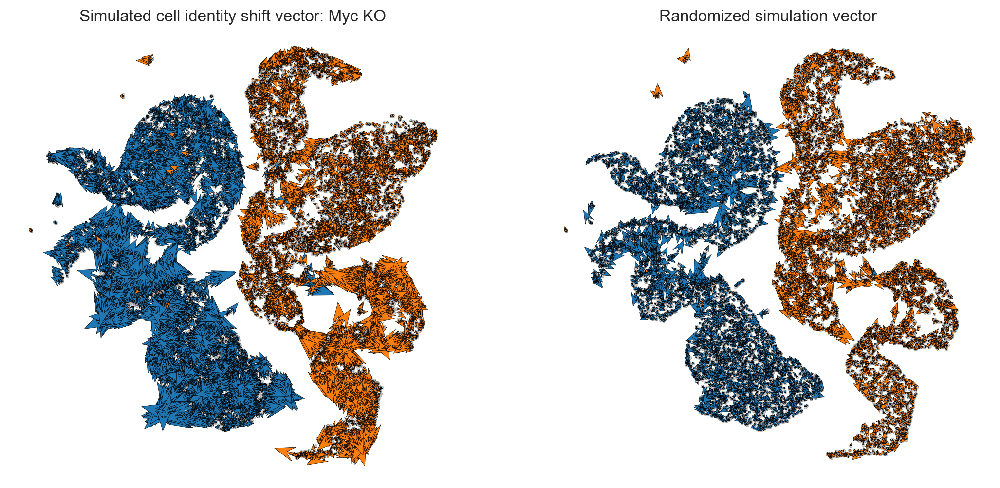

In [163]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale = 25
# Show quiver plot
oracle.plot_quiver(scale=scale, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {genes_of_interest} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_quiver_random(scale=scale, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

In [164]:
# n_grid = 40 is a good starting value.
n_grid = 40
oracle.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)

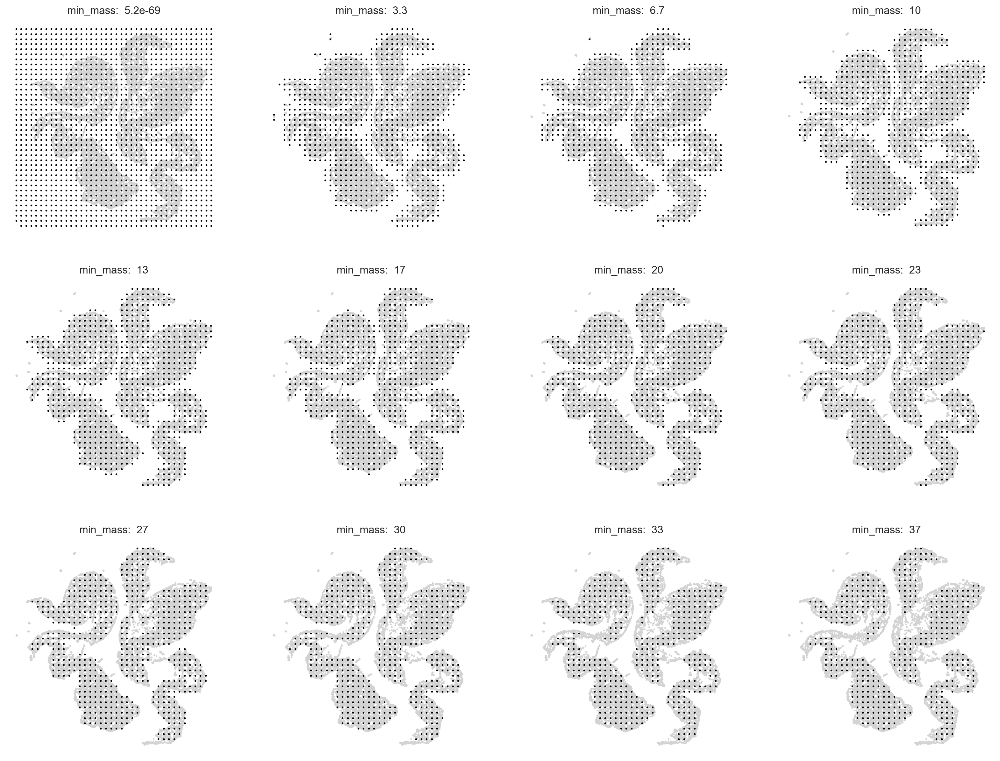

In [165]:
# Search for best min_mass.
oracle.suggest_mass_thresholds(n_suggestion=12)



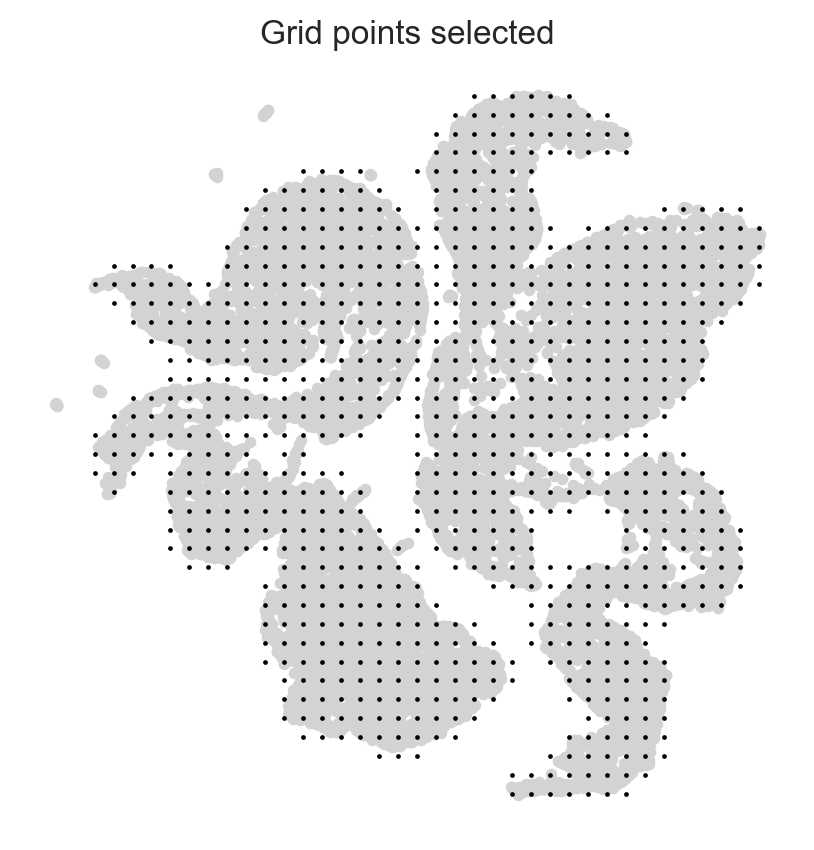

In [166]:
min_mass = 10  #1.5 #2.9e+04  # 5e+03 4.9e+03 #1.9e+04
oracle.calculate_mass_filter(min_mass=min_mass, plot=True)

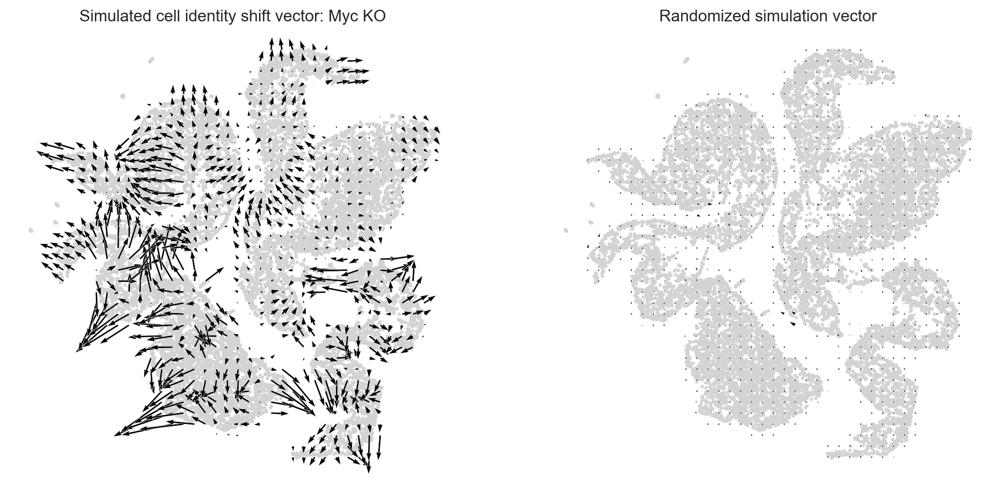

In [167]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale_simulation = 10
# Show quiver plot
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {genes_of_interest } KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

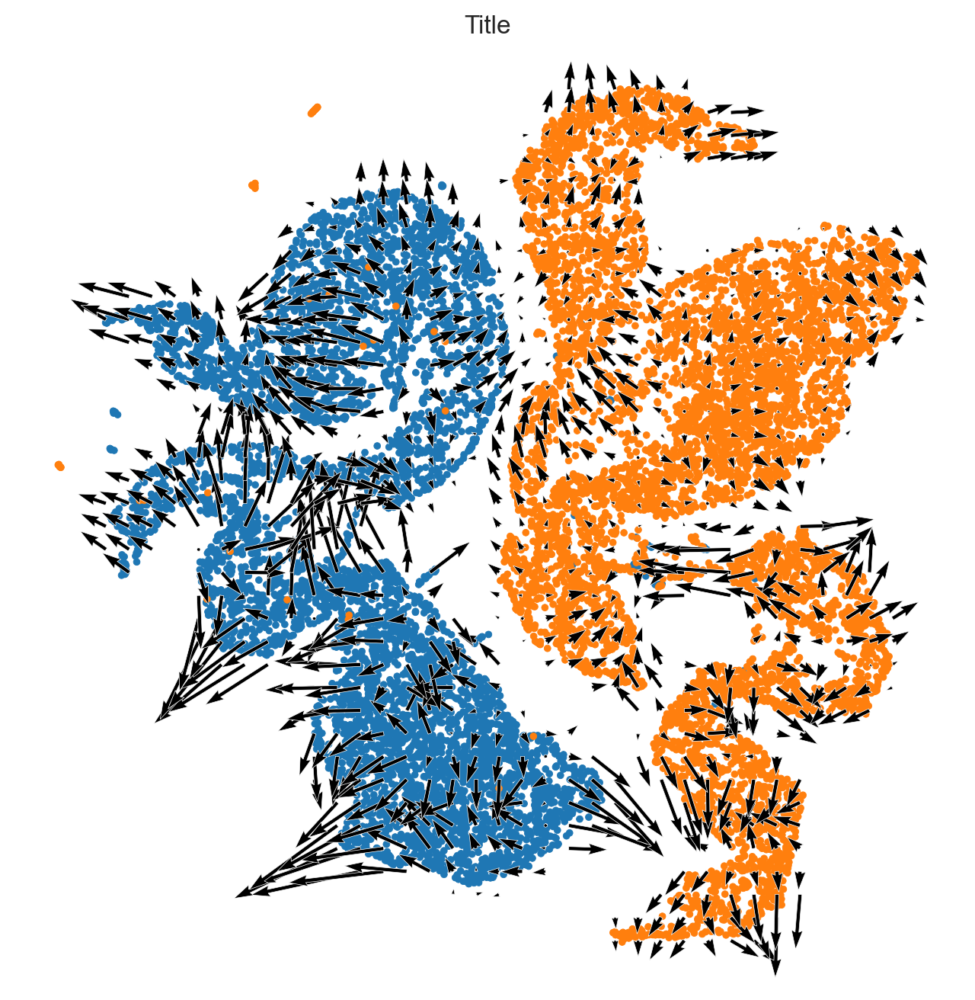

In [177]:
# Plot vector field with cell cluster
fig, ax = plt.subplots(figsize=[8, 8])

oracle.plot_cluster_whole(ax=ax, s=10)
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax, show_background=False)

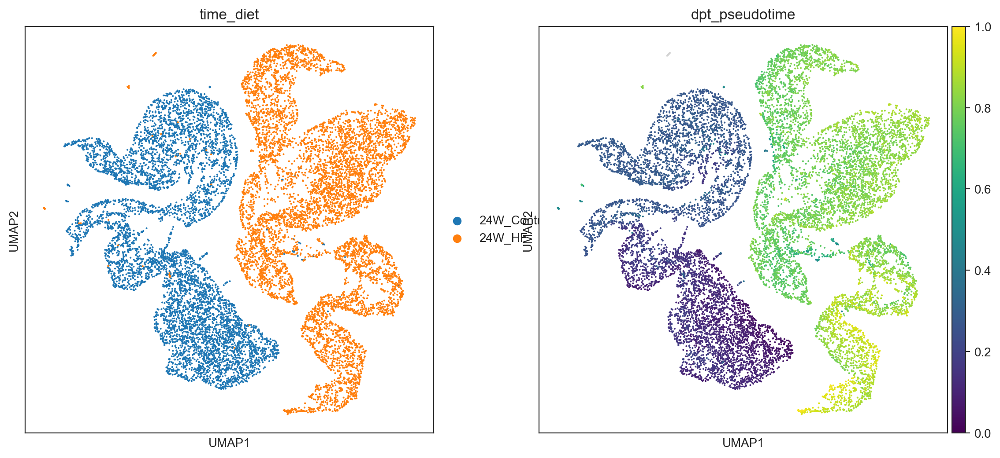

In [178]:
sc.pl.umap(oracle.adata, color=[oracle.cluster_column_name, 'dpt_pseudotime'],
                 layer="imputed_count", use_raw=False, cmap="viridis", ncols = 2)

# Compare Simulation Vector with Development Vectors

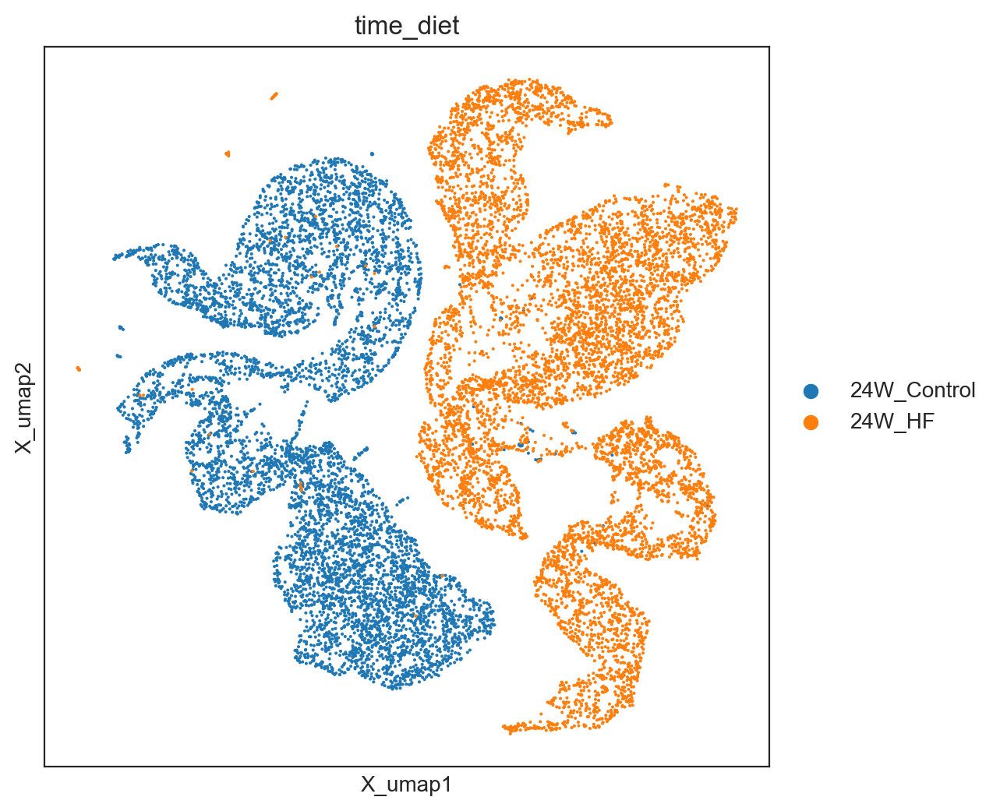

In [179]:
# Visualize pseudotime
fig, ax = plt.subplots(figsize=[6,6])

sc.pl.embedding(adata=oracle.adata, basis=oracle.embedding_name, ax=ax, cmap="rainbow",
                color=['time_diet'])

In [180]:
from celloracle.applications import Gradient_calculator

# Instantiate Gradient calculator object
gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="dpt_pseudotime")


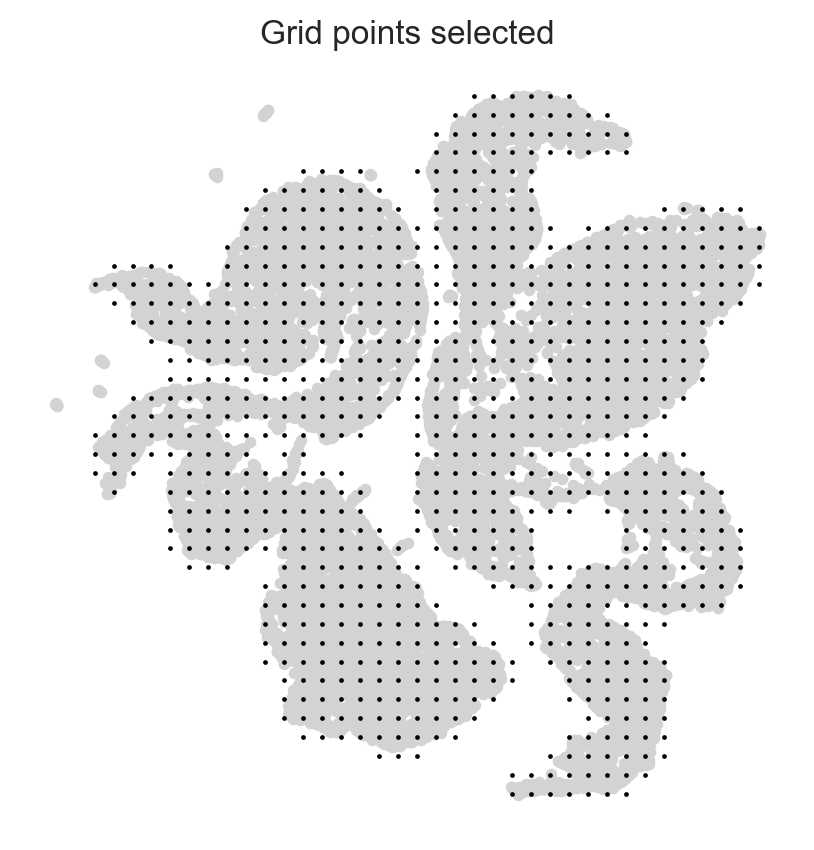

In [181]:
gradient.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
gradient.calculate_mass_filter(min_mass=min_mass, plot=True)

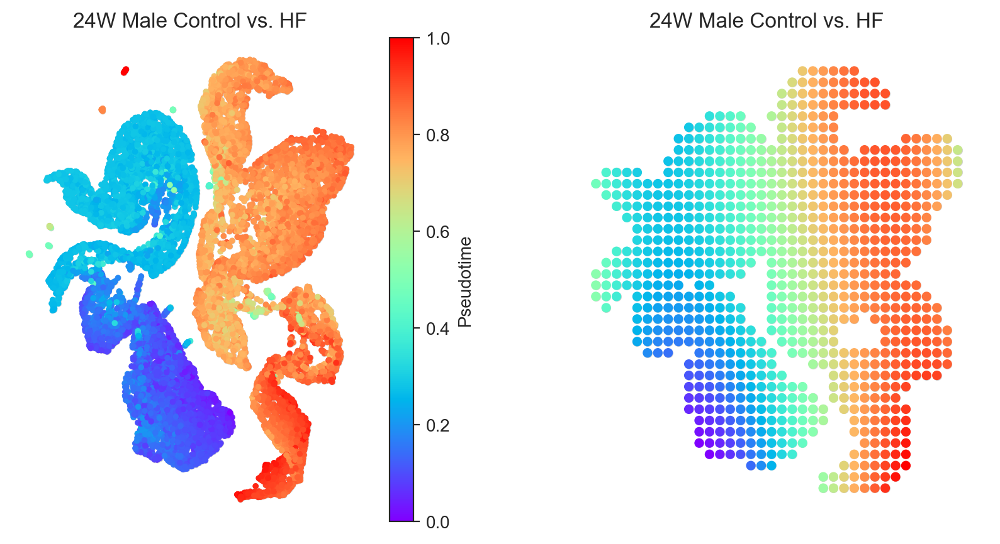

In [182]:
gradient.transfer_data_into_grid(args={"method": "polynomial", "n_poly":3}, plot=True, title ='24W Male Control vs. HF')

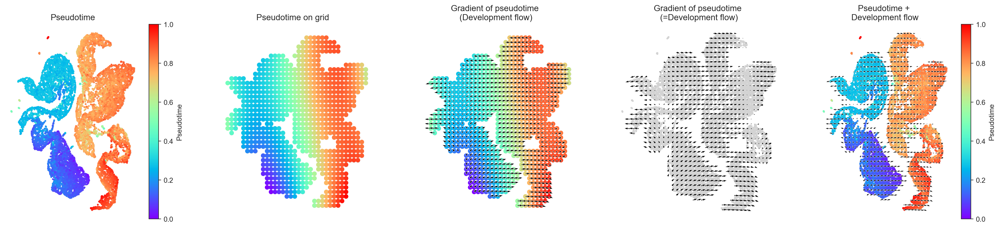

In [183]:
# Calculate graddient
gradient.calculate_gradient()

# Show results
scale_dev = 40
gradient.visualize_results(scale=scale_dev, s=5)



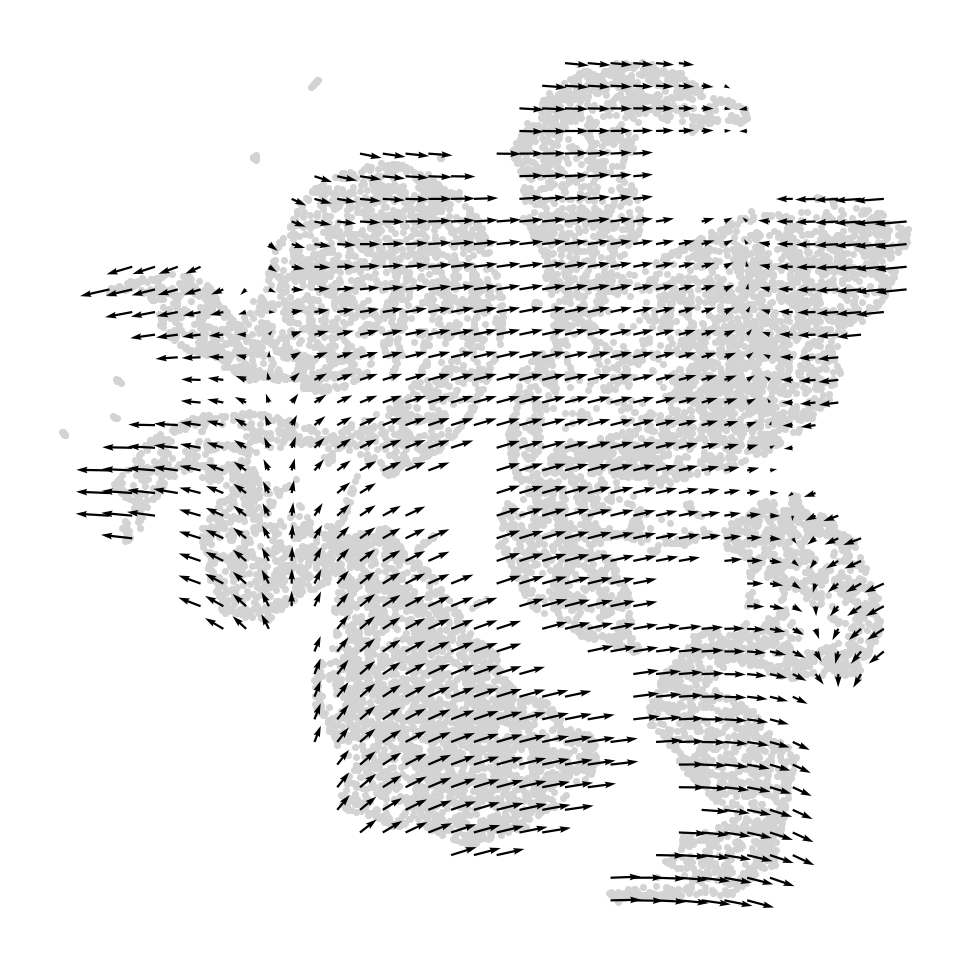

In [184]:
# Visualize results
fig, ax = plt.subplots(figsize=[6, 6])
gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax)

In [185]:
from celloracle.applications import Oracle_development_module

# Make Oracle_development_module to compare two vector field
dev = Oracle_development_module()

# Load development flow
dev.load_differentiation_reference_data(gradient_object=gradient)

# Load simulation result
dev.load_perturb_simulation_data(oracle_object=oracle)


# Calculate inner produc scores
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)



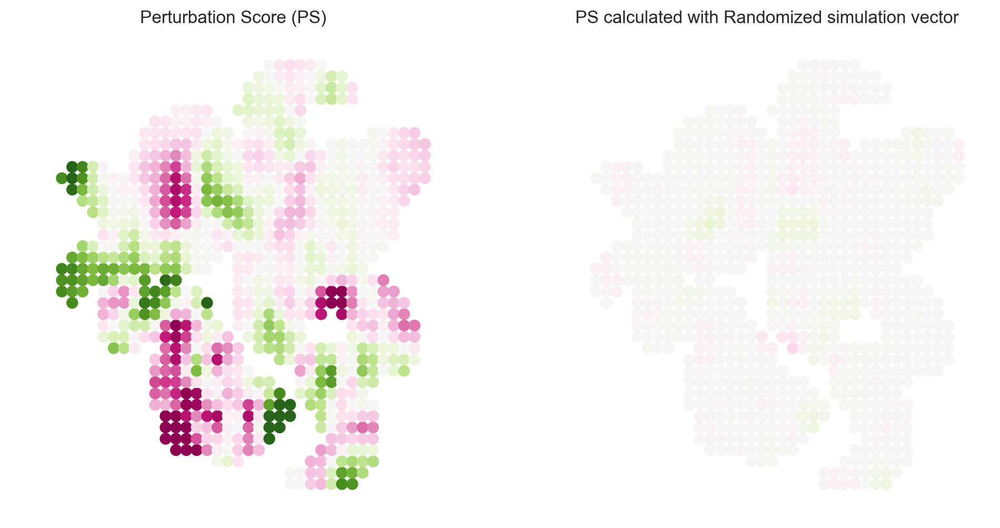

In [186]:
# Show perturbation scores
vm = 0.5

fig, ax = plt.subplots(1, 2, figsize=[12, 6])
dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax[0])
ax[0].set_title(f"Perturbation Score (PS)")

dev.plot_inner_product_random_on_grid(vm=vm, s=50, ax=ax[1])
ax[1].set_title(f"PS calculated with Randomized simulation vector")
plt.show()



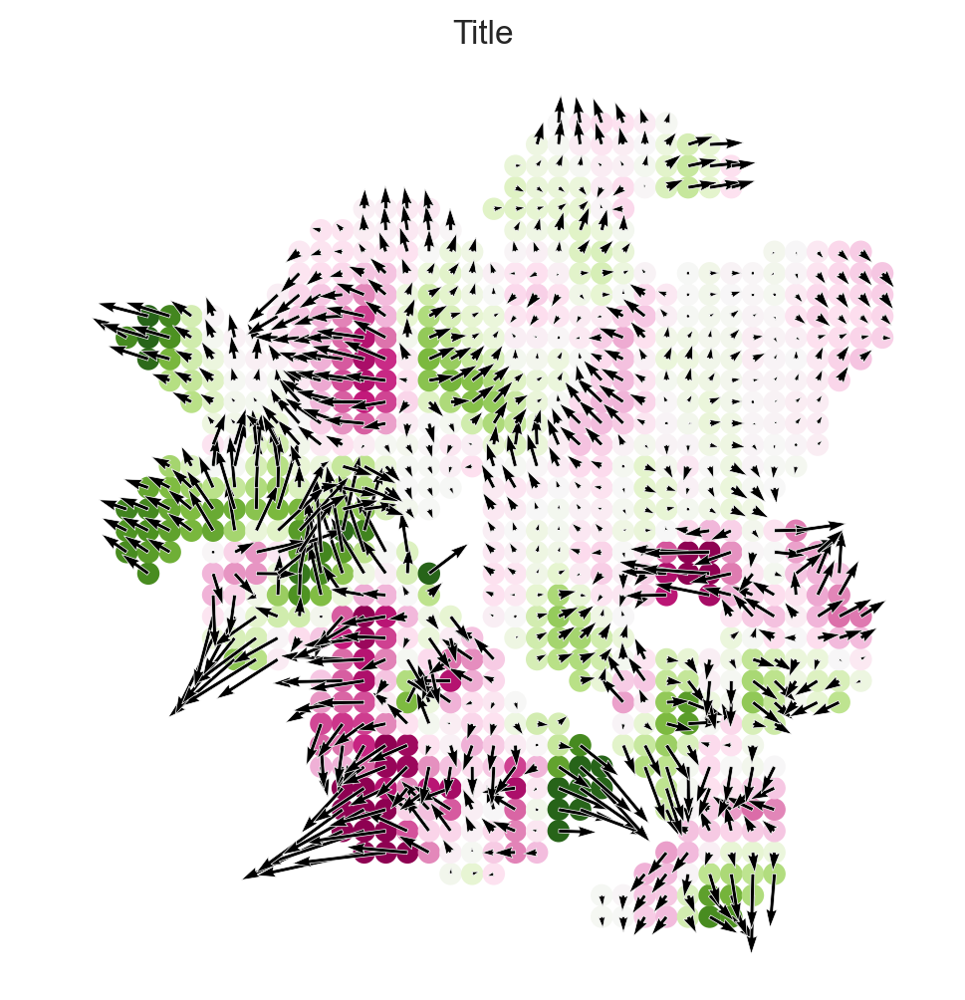

In [187]:
# Show perturbation scores with perturbation simulation vector field
fig, ax = plt.subplots(figsize=[6, 6])
dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax)
dev.plot_simulation_flow_on_grid(scale=scale_simulation, show_background=False, ax=ax)

2025-08-18 14:02:26,325 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-18 14:02:26,330 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


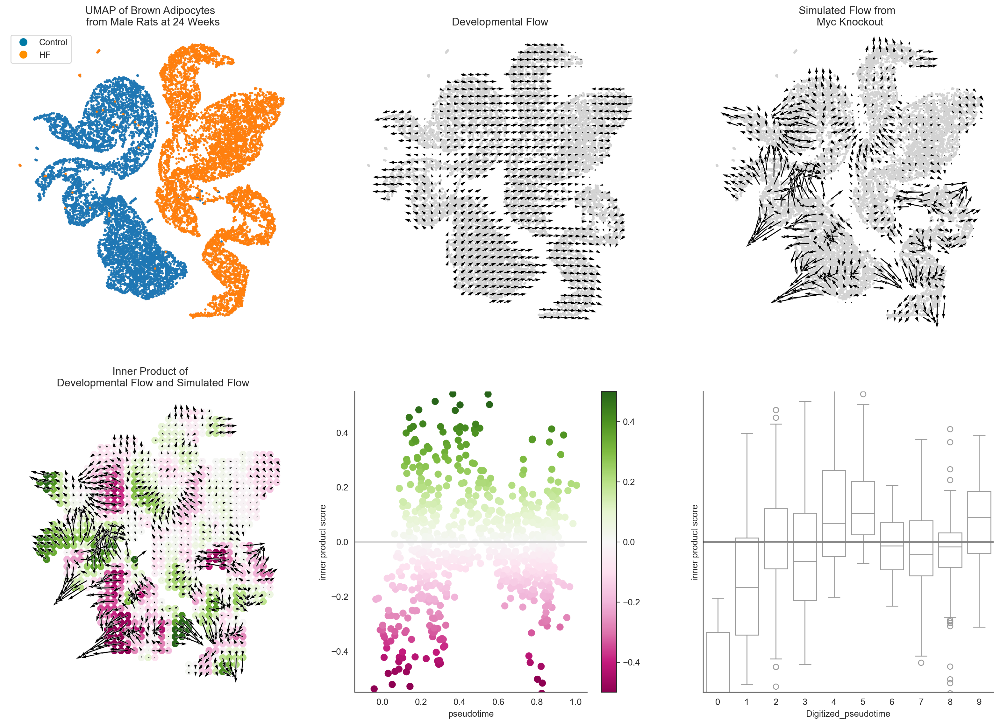

In [188]:
# Let's visualize the results
dev.visualize_development_module_layout_0(s=5,
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev,
                                          vm=vm, title=['UMAP of Brown Adipocytes \n from Male Rats at 24 Weeks','Developmental Flow',f'Simulated Flow from \n {genes_of_interest } Knockout','Inner Product of \n Developmental Flow and Simulated Flow','',''], 
                                          legend= [['Control', 'HF']], label_colors= ["#007aa5", "#ff9000"] ) # Blue and Orange



